In [1]:
import subprocess # Para ejecutar comandos del sistema y verificar la GPU disponible
print(subprocess.run(['nvidia-smi'], capture_output=True, text=True).stdout) # Muestra información de la GPU NVIDIA
import torch # Verificar la versión de PyTorch y la disponibilidad de CUDA (GPU)
print(f"PyTorch: {torch.__version__}") # Muestra la versión de PyTorch
print(f"CUDA disponible: {torch.cuda.is_available()}") # Verifica si CUDA (GPU) está disponible
if torch.cuda.is_available(): # Si hay una GPU disponible, muestra su nombre y memoria VRAM
    props = torch.cuda.get_device_properties(0) # Obtiene las propiedades de la GPU
    print(f"GPU: {props.name}") # Muestra el nombre de la GPU
    print(f"VRAM: {props.total_memory / 1e9:.1f} GB") # Muestra la memoria VRAM total en GB
else:
    print("Sin GPU - Cambiar tipo de entorno de ejecución a T4 GPU")

Tue Jun  2 03:08:14 2026       
+-----------------------------------------------------------------------------------------+
| NVIDIA-SMI 580.82.07              Driver Version: 580.82.07      CUDA Version: 13.0     |
+-----------------------------------------+------------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id          Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |           Memory-Usage | GPU-Util  Compute M. |
|                                         |                        |               MIG M. |
|=========================================+========================+======================|
|   0  Tesla T4                       Off |   00000000:00:04.0 Off |                    0 |
| N/A   45C    P8             10W /   70W |       0MiB /  15360MiB |      0%      Default |
|                                         |                        |                  N/A |
+-----------------------------------------+-----

In [2]:
# Paso 2: Instalación de dependencias
get_ipython().system('pip install -q diffusers transformers accelerate safetensors controlnet_aux opencv-python-headless xformers') # Instala las bibliotecas necesarias para el taller, incluyendo Diffusers, Transformers, Accelerate, SafeTensors, ControlNet Auxiliary, OpenCV y xformers

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 290.4/290.4 kB 8.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 3.3/3.3 MB 85.7 MB/s eta 0:00:00


In [3]:
# Paso 3: Importar las bibliotecas necesarias para el taller
import torch # Biblioteca principal para computación en GPU
import numpy as np # Biblioteca para manipulación de arrays
from PIL import Image # Biblioteca para procesamiento de imágenes
import matplotlib.pyplot as plt # Biblioteca para visualización de imágenes
import cv2, gc, os # Son bibliotecas para procesamiento de imágenes, manejo de memoria y operaciones del sistema
from IPython.display import display, clear_output # Biblioteca para mostrar imágenes en Jupyter
from google.colab import files # Biblioteca para manejar archivos en Google Colab
from diffusers import StableDiffusionControlNetPipeline, ControlNetModel, UniPCMultistepScheduler    # Importa la clase StableDiffusionControlNetPipeline para crear el pipeline de generación de imágenes con ControlNet, ControlNetModel para cargar modelos de ControlNet y UniPCMultistepScheduler para la programación de pasos en la generación de imágenes
from controlnet_aux import CannyDetector, MidasDetector, OpenposeDetector # Importa detectores auxiliares para ControlNet, incluyendo CannyDetector para detección de bordes, MidasDetector para estimación de profundidad y OpenposeDetector para detección de poses humanas
# Constantes globales
DEVICE = "cuda" if torch.cuda.is_available() else "cpu" # Define el dispositivo a usar (GPU si está disponible, de lo contrario CPU)
DTYPE = torch.float16 if torch.cuda.is_available() else torch.float32 # Define el tipo de datos a usar (float16 si está disponible, de lo contrario float32)
SEED = 39 # Semilla para reproducibilidad
STEPS = 25 # Pasos de denoising (mayor = mejor calidad, más lento)
BASE_MODEL = "runwayml/stable-diffusion-v1-5" # Modelo base para la generación de imágenes

NEG = "blurry, bad quality, distorted, watermark, ugly, low resolution, deformed, artifacts" # Prompt negativo global para evitar resultados no deseados

Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
Flax classes are deprecated and will be removed in Diffusers v1.0.0. We recommend migrating to PyTorch classes or pinning your version of Diffusers.
/usr/local/lib/python3.12/dist-packages/controlnet_aux/mediapipe_face/mediapipe_face_common.py:7: UserWarning: The module 'mediapipe' is not installed. The package will have limited functionality. Please install it using the command: pip install 'mediapipe'
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/timm/models/layers/__init__.py:49: FutureWarning: Importing from timm.models.layers is deprecated, please import via timm.layers
  warnings.warn(f"Importing from {__name__} is deprecated, please import via timm.layers", FutureWarning)
/usr/local/lib/python3.12/dist-packages/timm/models/registry.py:4: FutureWarning: Importing from timm.models.registry is deprecated, please import via t

In [4]:
# Paso 4: Funciones de utilidad para el taller
def resize_for_sd(img: Image.Image, target: int = 512) -> Image.Image:
    """
    Redimensiona imagen al tamaño que espera Stable Diffusion.
    El lado más largo queda en `target` píxeles.
    Las dimensiones deben ser múltiplo de 8.
    """
    w, h = img.size # Obtiene el ancho y alto de la imagen
    ratio = target / max(w, h) # Calcula la relación de redimensionamiento para que el lado más largo sea igual a `target`
    nw, nh = int(w * ratio), int(h * ratio) # Calcula las nuevas dimensiones de la imagen
    nw = (nw // 8) * 8   # Múltiplo de 8 requerido y
    nh = (nh // 8) * 8
    return img.resize((nw, nh), Image.LANCZOS) # Redimensiona la imagen usando el método LANCZOS para mantener la calidad
def make_gen(seed: int = SEED) -> torch.Generator:
    """Crea un generador con semilla fija (para reproducibilidad)."""
    return torch.Generator(device="cpu").manual_seed(seed) # Crea un generador de números aleatorios con la semilla especificada
def free_gpu():
    """Libera memoria GPU entre experimentos."""
    gc.collect() # Libera memoria no utilizada en la CPU
    if torch.cuda.is_available(): # Si hay una GPU disponible, vacía la memoria
        torch.cuda.empty_cache() # Vacía la caché de memoria de la GPU
    vram_free = torch.cuda.memory_reserved(0) / 1e9 # Calcula la cantidad de VRAM reservada en GB
    print(f"VRAM liberada — reservada: {vram_free:.2f} GB")
def show_comparison(images: list,
                    labels: list,
                    title: str = "",
                    save_path: str = None,
                    figsize: tuple = (20, 5)): # Función para mostrar varias imágenes lado a lado con sus etiquetas, opcionalmente guardando la figura resultante
    """Muestra varias imágenes lado a lado y las guarda en media/."""
    fig, axes = plt.subplots(1, len(images), figsize=figsize)
    if len(images) == 1:
        axes = [axes]
    for ax, img, lbl in zip(axes, images, labels):
        ax.imshow(img)
        ax.set_title(lbl, fontsize=11, fontweight='bold', pad=8)
        ax.axis('off')
    if title:
        fig.suptitle(title, fontsize=13, fontweight='bold', y=1.01)
    plt.tight_layout()
    if save_path:
        plt.savefig(save_path, dpi=150, bbox_inches='tight')
        print(f"Guardado: {save_path}")
    plt.show()
    plt.close()
def load_pipe(controlnet_id: str) -> StableDiffusionControlNetPipeline:
    """
    Carga un pipeline de Stable Diffusion + ControlNet.
    Aplica optimizaciones de memoria para Colab T4.
    """
    free_gpu() # Libera memoria GPU
    print(f"Cargando ControlNet: {controlnet_id.split('/')[-1]} ...") # Imprime el nombre del modelo de ControlNet que se está cargando (extraído del ID del modelo)

    # 1. Carga el modelo ControlNet específico
    controlnet = ControlNetModel.from_pretrained(controlnet_id, torch_dtype=DTYPE)

    # 2. Crea el pipeline completo SD + ControlNet
    pipe = StableDiffusionControlNetPipeline.from_pretrained(
        BASE_MODEL,
        controlnet=controlnet,
        torch_dtype=DTYPE,
        safety_checker=None,     # Desactivamos checker para velocidad
    )

    # 3. Scheduler más rápido (UniPC vs DDPM por defecto)
    pipe.scheduler = UniPCMultistepScheduler.from_config(pipe.scheduler.config)

    # 4. CPU Offload: mueve capas a CPU cuando no se usan → ahorra VRAM
    pipe.enable_model_cpu_offload()

    # 5. Atención eficiente con xformers (si está disponible)
    try:
        pipe.enable_xformers_memory_efficient_attention()
        print("xformers habilitado (más rápido)")
    except Exception:
        print("xformers no disponible — atención estándar")

    print(f"Pipeline listo")
    return pipe
def generar_con_y_sin_control(pipe, prompt, cond_img, neg=NEG, scale=1.0, seed=SEED):
    """
    Genera dos imágenes para comparar:
      - scale=0: ControlNet desactivado (solo texto guía)
      - scale=1: ControlNet activado (texto + condición visual)
    """
    # Sin control visual (conditioning_scale=0 neutraliza el ControlNet)
    print("Generando SIN condición visual...")
    sin_ctrl = pipe( # Genera una imagen usando el pipeline con ControlNet desactivado (conditioning_scale=0)
        prompt, # El prompt de texto para guiar la generación de la imagen
        negative_prompt=neg, # El prompt negativo para evitar resultados no deseados
        image=cond_img, # La imagen de condición que se pasará al pipeline (aunque no afectará la generación debido a conditioning_scale=0)
        num_inference_steps=STEPS, # El número de pasos de denoising para la generación de la imagen
        controlnet_conditioning_scale=0.0,    # ← ControlNet desactivado, solo texto guía
        generator=make_gen(seed) # El generador con semilla fija para reproducibilidad
    ).images[0] # Obtiene la imagen generada (la primera imagen del resultado)
    # Con control visual
    print("Generando CON condición visual...")
    con_ctrl = pipe(
        prompt,
        negative_prompt=neg,
        image=cond_img,
        num_inference_steps=STEPS,
        controlnet_conditioning_scale=scale,  # ← ControlNet activo
        generator=make_gen(seed)
    ).images[0]
    return sin_ctrl, con_ctrl

os.makedirs("media",  exist_ok=True)
os.makedirs("python", exist_ok=True)
print("Carpetas creadas: media/  python/")

Carpetas creadas: media/  python/


In [8]:
print("Subir imágenes en el siguiente orden: edificios, escritorio, pose:")
uploaded = files.upload() # Permite al usuario subir archivos desde su computadora a Google Colab
filenames = list(uploaded.keys()) # Obtiene los nombres de los archivos subidos
if len(filenames) < 3:
    print(f"Solo se subieron {len(filenames)} imagen(es).")
    print(" Vuelve a ejecutar esta celda para subir las restantes.")
else:
    print(f"\n Imágenes recibidas:")
    for i, f in enumerate(filenames, 1):
        print(f"   {i}. {f}")

Subir imágenes en el siguiente orden: edificios, escritorio, pose:


Saving pose.jpg to pose.jpg
Solo se subieron 1 imagen(es).
 Vuelve a ejecutar esta celda para subir las restantes.


In [10]:
filenames = ['edificios.jpg', 'escritorio.jpg', 'pose.jpg'] # Define explicitly, assuming these files are uploaded.
print(f"Using filenames: {filenames}")

Using filenames: ['edificios.jpg', 'escritorio.jpg', 'pose.jpg']


Dimensiones de imágenes cargadas:
  Edificios:  (512, 288)
  Escritorio: (512, 384)
  Pose:       (512, 512)
Guardado: media/00_imagenes_originales.png


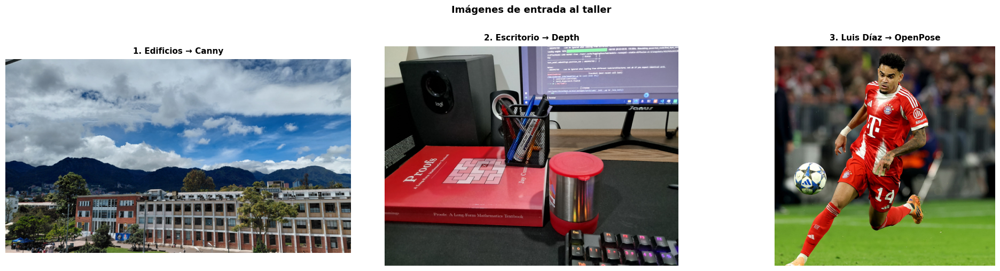

In [11]:
# Paso 6: Cargar y preparar imágenes
# Cargar, convertir a RGB y redimensionar a 512px (requerido por Stable Diffusion)
img_edificios  = resize_for_sd(Image.open(filenames[0]).convert("RGB"))
img_escritorio = resize_for_sd(Image.open(filenames[1]).convert("RGB"))
img_pose       = resize_for_sd(Image.open(filenames[2]).convert("RGB"))

img_edificios.save("media/00_original_edificios.png")
img_escritorio.save("media/00_original_escritorio.png")
img_pose.save("media/00_original_pose.png")

print("Dimensiones de imágenes cargadas:")
print(f"  Edificios:  {img_edificios.size}")
print(f"  Escritorio: {img_escritorio.size}")
print(f"  Pose:       {img_pose.size}")

show_comparison(
    [img_edificios, img_escritorio, img_pose],
    ["1. Edificios → Canny", "2. Escritorio → Depth", "3. Luis Díaz → OpenPose"],
    title="Imágenes de entrada al taller",
    save_path="media/00_imagenes_originales.png"
)

Paso 7: Condición Canny (Bordes)
Guardado: media/01_condicion_comparacion.png


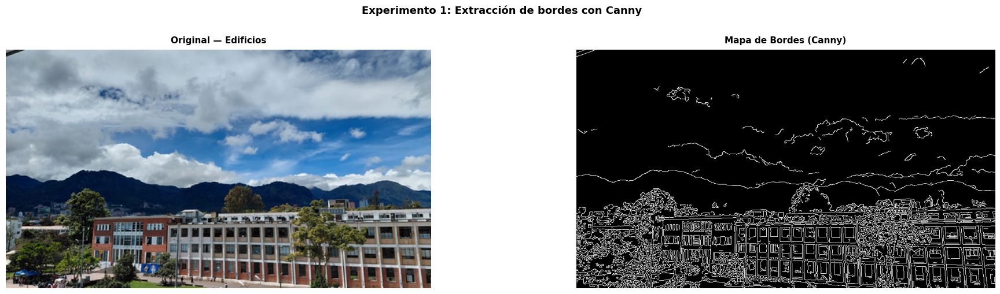

Mapa de bordes generado y guardado


In [12]:
# Paso 7: Condición Canny: Extracción de bordes o contornos de la imagen de edificios y los usa como guía visual para generar una nueva imagen.
print("Paso 7: Condición Canny (Bordes)")
# El CannyDetector detecta bordes usando el algoritmo de Canny:
#   low_threshold  = intensidad mínima para considerar un borde
#   high_threshold = intensidad máxima (bordes fuertes siempre se incluyen)
detector_canny = CannyDetector()
cond_canny = detector_canny(img_edificios, low_threshold=100, high_threshold=200)
cond_canny = cond_canny.convert("RGB")  # ControlNet espera RGB
cond_canny.save("media/01_condicion_canny.png")

# También visualizamos con OpenCV para entender el proceso
img_np   = np.array(img_edificios.convert("L"))         # Escala de grises
edges_cv = cv2.Canny(img_np, 100, 200)                  # Bordes en numpy
img_edges_pil = Image.fromarray(edges_cv).convert("RGB") # Convertimos a PIL para mostrar con la función de comparación

show_comparison(
    [img_edificios, cond_canny],
    ["Original — Edificios", "Mapa de Bordes (Canny)"],
    title="Experimento 1: Extracción de bordes con Canny",
    save_path="media/01_condicion_comparacion.png"
)

print("Mapa de bordes generado y guardado")

VRAM liberada — reservada: 0.00 GB
Cargando ControlNet: sd-controlnet-canny ...


/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_validators.py:205: UserWarning: The `local_dir_use_symlinks` argument is deprecated and ignored in `hf_hub_download`. Downloading to a local directory does not use symlinks anymore.
  warnings.warn(
/usr/local/lib/python3.12/dist-packages/huggingface_hub/utils/_auth.py:112: UserWarning: 
The secret `HF_TOKEN` does not exist in your Colab secrets.
To authenticate with the Hugging Face Hub, create a token in your settings tab (https://huggingface.co/settings/tokens), set it as secret in your Google Colab and restart your session.
You will be able to reuse this secret in all of your notebooks.
Please note that authentication is recommended but still optional to access public models or datasets.
  warnings.warn(


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

model_index.json:   0%|          | 0.00/541 [00:00<?, ?B/s]

Fetching 13 files:   0%|          | 0/13 [00:00<?, ?it/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results

xformers habilitado (más rápido)
Pipeline listo
Generando SIN condición visual...


  0%|          | 0/25 [00:00<?, ?it/s]

Generando CON condición visual...


  0%|          | 0/25 [00:00<?, ?it/s]

Guardado: media/01_comparacion_final.png


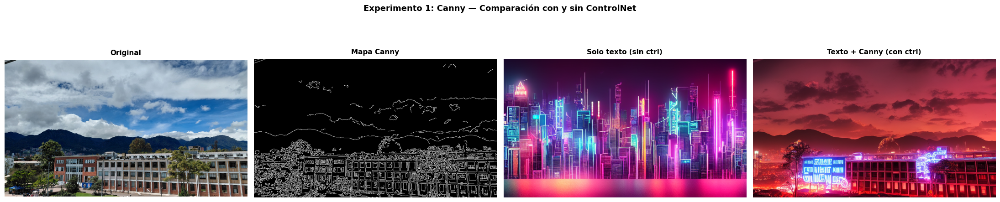

VRAM liberada — reservada: 0.02 GB
Experimento 1 completado



In [13]:
# Paso 8: Generación con Canny
pipe = load_pipe("lllyasviel/sd-controlnet-canny")

PROMPT_CANNY = (
    "futuristic cyberpunk city skyline at night, glowing neon signs, "
    "rain reflections, ultra-detailed architecture, cinematic lighting, 8k"
)

sin_ctrl_c, con_ctrl_c = generar_con_y_sin_control(pipe, PROMPT_CANNY, cond_canny)
sin_ctrl_c.save("media/01_resultado_sin_control.png")
con_ctrl_c.save("media/01_resultado_con_canny.png")

show_comparison(
    [img_edificios, cond_canny, sin_ctrl_c, con_ctrl_c],
    ["Original", "Mapa Canny", "Solo texto (sin ctrl)", "Texto + Canny (con ctrl)"],
    title="Experimento 1: Canny — Comparación con y sin ControlNet",
    save_path="media/01_comparacion_final.png",
    figsize=(22, 5)
)

del pipe
free_gpu()
print("Experimento 1 completado\n")


Paso 9: Condición Midas (Depth Map)


dpt_hybrid-midas-501f0c75.pt:   0%|          | 0.00/493M [00:00<?, ?B/s]

/usr/local/lib/python3.12/dist-packages/timm/models/_factory.py:138: UserWarning: Mapping deprecated model name vit_base_resnet50_384 to current vit_base_r50_s16_384.orig_in21k_ft_in1k.
  model = create_fn(


Guardado: media/02_condicion_comparacion.png


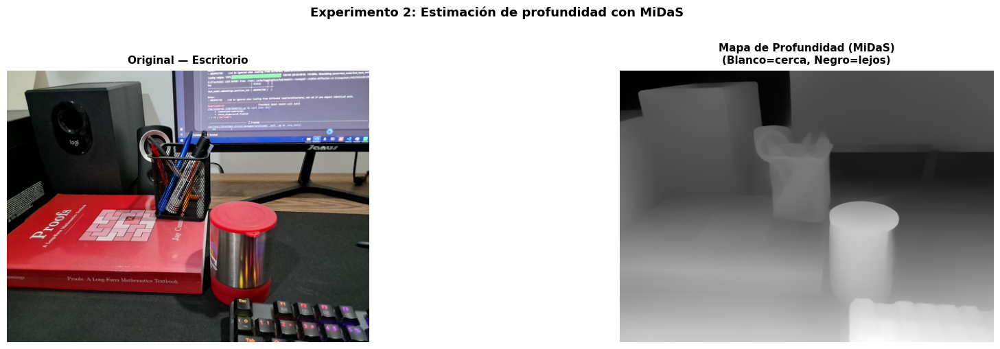

Mapa de profundidad generado


In [14]:
# Paso 9: Condición Midas - Con DEPTH MAP que es la estimación de profundidad de la escena, se puede guiar a Stable Diffusion para generar imágenes con una percepción más realista de la distancia y la estructura espacial. Las zonas claras representan objetos más cercanos, mientras que las zonas oscuras representan objetos más lejanos.
print("Paso 9: Condición Midas (Depth Map)")
# MiDaS: estimación de profundidad relativa (monocular depth estimation)
# No necesita cámara estéreo — infiere profundidad desde una sola imagen
detector_depth = MidasDetector.from_pretrained("lllyasviel/Annotators")
cond_depth = detector_depth(img_escritorio)
cond_depth = cond_depth.convert("RGB")
cond_depth.save("media/02_condicion_depth.png")

show_comparison(
    [img_escritorio, cond_depth],
    ["Original — Escritorio", "Mapa de Profundidad (MiDaS)\n(Blanco=cerca, Negro=lejos)"],
    title="Experimento 2: Estimación de profundidad con MiDaS",
    save_path="media/02_condicion_comparacion.png"
)

print("Mapa de profundidad generado")

VRAM liberada — reservada: 0.02 GB
Cargando ControlNet: sd-controlnet-depth ...


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results

xformers habilitado (más rápido)
Pipeline listo
Generando SIN condición visual...


  0%|          | 0/25 [00:00<?, ?it/s]

Generando CON condición visual...


  0%|          | 0/25 [00:00<?, ?it/s]

Guardado: media/02_comparacion_final.png


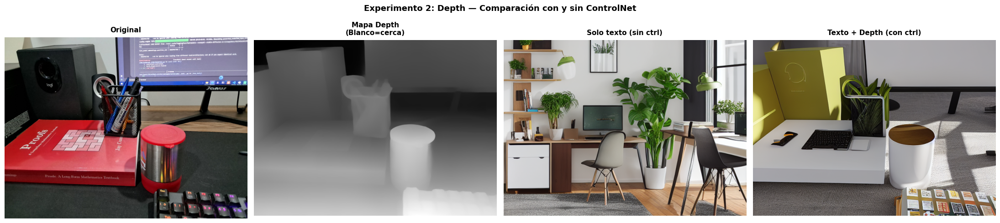

VRAM liberada — reservada: 0.02 GB
Experimento 2 completado



In [15]:
# Paso 10: Generación con Depth Map
pipe = load_pipe("lllyasviel/sd-controlnet-depth")

PROMPT_DEPTH = (
    "cozy modern home office with warm amber lighting, "
    "books stacked on desk, green plants, dual monitors, "
    "photorealistic interior design, 8k, detailed"
)
sin_ctrl_d, con_ctrl_d = generar_con_y_sin_control(pipe, PROMPT_DEPTH, cond_depth)
sin_ctrl_d.save("media/02_resultado_sin_control.png")
con_ctrl_d.save("media/02_resultado_con_depth.png")
show_comparison(
    [img_escritorio, cond_depth, sin_ctrl_d, con_ctrl_d],
    ["Original", "Mapa Depth\n(Blanco=cerca)", "Solo texto (sin ctrl)", "Texto + Depth (con ctrl)"],
    title="Experimento 2: Depth — Comparación con y sin ControlNet",
    save_path="media/02_comparacion_final.png",
    figsize=(22, 5)
)
del pipe
free_gpu()
print("Experimento 2 completado\n")

body_pose_model.pth:   0%|          | 0.00/209M [00:00<?, ?B/s]

hand_pose_model.pth:   0%|          | 0.00/147M [00:00<?, ?B/s]

facenet.pth:   0%|          | 0.00/154M [00:00<?, ?B/s]

Guardado: media/03_condicion_comparacion.png


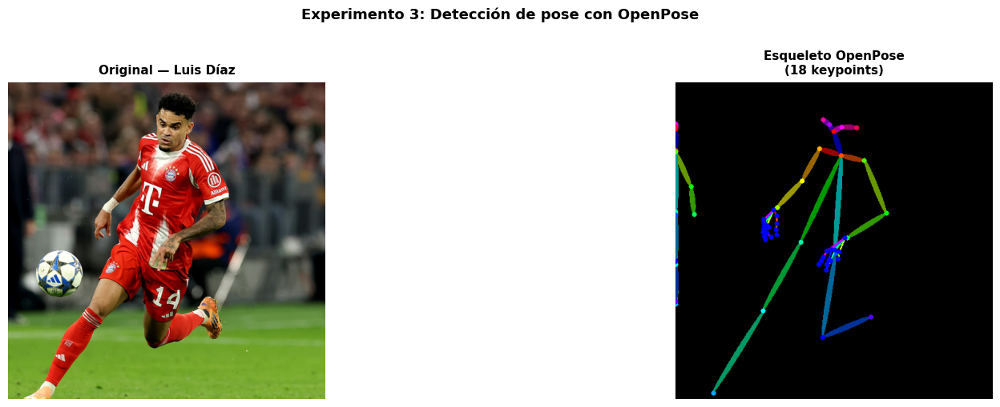

Esqueleto de pose generado


In [16]:
# Paso 11: Condición OpenPose - Pemite la deteccion de key points , con Open Pose se pueden detectar las articulaciones y posiciones clave del cuerpo humano como cuello, manos, codos.

detector_pose = OpenposeDetector.from_pretrained("lllyasviel/Annotators")
cond_pose = detector_pose(img_pose, include_hand=True, include_face=False)
cond_pose = cond_pose.convert("RGB")
cond_pose.save("media/03_condicion_pose.png")

show_comparison(
    [img_pose, cond_pose],
    ["Original — Luis Díaz", "Esqueleto OpenPose\n(18 keypoints)"],
    title="Experimento 3: Detección de pose con OpenPose",
    save_path="media/03_condicion_comparacion.png"
)

print("Esqueleto de pose generado")

VRAM liberada — reservada: 0.02 GB
Cargando ControlNet: sd-controlnet-openpose ...


config.json:   0%|          | 0.00/920 [00:00<?, ?B/s]

diffusion_pytorch_model.safetensors:   0%|          | 0.00/1.45G [00:00<?, ?B/s]

Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results

xformers habilitado (más rápido)
Pipeline listo
Generando: ⚽ Futbolista...


  0%|          | 0/25 [00:00<?, ?it/s]

Generando: 🦸 Superhéroe...


  0%|          | 0/25 [00:00<?, ?it/s]

Generando: ⚔️ Samurái...


  0%|          | 0/25 [00:00<?, ?it/s]

/tmp/ipykernel_391/4124835373.py:39: UserWarning: Glyph 9917 (\N{SOCCER BALL}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_391/4124835373.py:39: UserWarning: Glyph 129464 (\N{SUPERHERO}) missing from font(s) DejaVu Sans.
  plt.tight_layout()
/tmp/ipykernel_391/4124835373.py:41: UserWarning: Glyph 9917 (\N{SOCCER BALL}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=150, bbox_inches='tight')
/tmp/ipykernel_391/4124835373.py:41: UserWarning: Glyph 129464 (\N{SUPERHERO}) missing from font(s) DejaVu Sans.
  plt.savefig(save_path, dpi=150, bbox_inches='tight')


Guardado: media/03_comparacion_personajes.png


/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 9917 (\N{SOCCER BALL}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)
/usr/local/lib/python3.12/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 129464 (\N{SUPERHERO}) missing from font(s) DejaVu Sans.
  fig.canvas.print_figure(bytes_io, **kw)


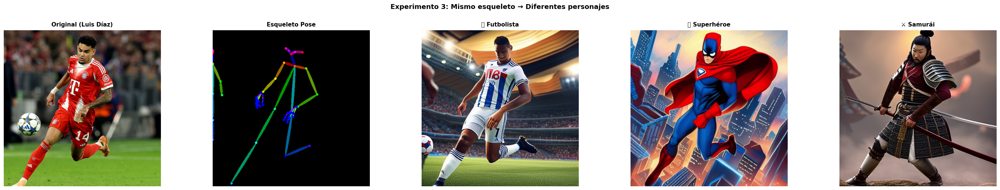

VRAM liberada — reservada: 0.02 GB
Experimento 3 completado



In [17]:
# Paso 12: Generación con OpenPose
pipe = load_pipe("lllyasviel/sd-controlnet-openpose") # Carga el pipeline de Stable Diffusion con ControlNet específico para OpenPose, que está diseñado para usar mapas de poses humanas como condición visual en la generación de imágenes

# El MISMO esqueleto — TRES personajes distintos
# Esto demuestra la separación entre estructura (pose) y apariencia (prompt)
prompts_pose = {
    "⚽ Futbolista": (
        "professional soccer player celebrating a spectacular goal, "
        "stadium full of fans, dramatic spotlights, sport photography, "
        "jersey, cleats, photorealistic, 8k",
        "media/03_resultado_futbolista.png"
    ),
    "🦸 Superhéroe": (
        "Marvel superhero celebrating victory, dramatic red and blue cape "
        "flowing in the wind, city skyline at night, comic book art style, "
        "vibrant colors, highly detailed, dynamic",
        "media/03_resultado_superheroe.png"
    ),
    "⚔️ Samurái": (
        "ancient Japanese samurai warrior in victory pose after battle, "
        "cherry blossom petals falling, traditional armor (katana), "
        "cinematic lighting, detailed, photorealistic",
        "media/03_resultado_samurai.png"
    ),
}
resultados  = [img_pose, cond_pose] # Para mostrar el original y la condición visual junto a los resultados generados
etiquetas   = ["Original (Luis Díaz)", "Esqueleto Pose"]

for nombre, (prompt, path) in prompts_pose.items(): # Itera sobre cada personaje y su prompt asociado para generar imágenes usando el mismo esqueleto de pose
    print(f"Generando: {nombre}...")
    resultado = pipe(
        prompt,
        negative_prompt=NEG,
        image=cond_pose,
        num_inference_steps=STEPS,
        controlnet_conditioning_scale=1.0,
        generator=make_gen(SEED)
    ).images[0]
    resultado.save(path)
    resultados.append(resultado)
    etiquetas.append(nombre)

show_comparison( # Muestra la comparación entre el original, la condición de pose y los resultados generados para cada personaje
    resultados,
    etiquetas,
    title="Experimento 3: Mismo esqueleto → Diferentes personajes",
    save_path="media/03_comparacion_personajes.png",
    figsize=(28, 5)
)

del pipe
free_gpu()
print("Experimento 3 completado\n")

VRAM liberada — reservada: 0.02 GB
Cargando ControlNet: sd-controlnet-canny ...


Loading pipeline components...:   0%|          | 0/6 [00:00<?, ?it/s]

Loading weights:   0%|          | 0/196 [00:00<?, ?it/s]

CLIPTextModel LOAD REPORT from: /root/.cache/huggingface/hub/models--runwayml--stable-diffusion-v1-5/snapshots/451f4fe16113bff5a5d2269ed5ad43b0592e9a14/text_encoder
Key                                | Status     |  | 
-----------------------------------+------------+--+-
text_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.
You have disabled the safety checker for <class 'diffusers.pipelines.controlnet.pipeline_controlnet.StableDiffusionControlNetPipeline'> by passing `safety_checker=None`. Ensure that you abide to the conditions of the Stable Diffusion license and do not expose unfiltered results in services or applications open to the public. Both the diffusers team and Hugging Face strongly recommend to keep the safety filter enabled in all public facing circumstances, disabling it only for use-cases that involve analyzing network behavior or auditing its results

xformers habilitado (más rápido)
Pipeline listo
  Generando scale=0.0...


  0%|          | 0/25 [00:00<?, ?it/s]

  Generando scale=0.3...


  0%|          | 0/25 [00:00<?, ?it/s]

  Generando scale=0.7...


  0%|          | 0/25 [00:00<?, ?it/s]

  Generando scale=1.0...


  0%|          | 0/25 [00:00<?, ?it/s]

  Generando scale=1.5...


  0%|          | 0/25 [00:00<?, ?it/s]

Guardado: media/04_comparacion_scales.png


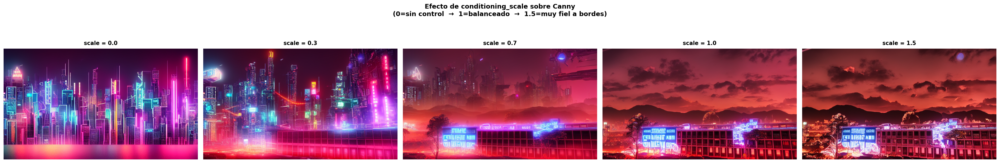

VRAM liberada — reservada: 0.02 GB
Experimento 4 completado



In [18]:
# Paso 13: Efecto de conditioning_scale: Se controla la influencia de la condición visual (Canny, Depth, Pose) en la generación de la imagen. Un valor de 0 desactiva el ControlNet, mientras que un valor de 1 lo activa completamente. Ajustar este parámetro permite encontrar un equilibrio entre seguir la guía visual y permitir que el modelo tenga más libertad creativa.

pipe = load_pipe("lllyasviel/sd-controlnet-canny") # Volvemos a usar el pipeline de Canny para este experimento, pero se puede repetir con Depth u OpenPose cambiando el pipeline y la imagen de condición

SCALES = [0.0, 0.3, 0.7, 1.0, 1.5] # Diferentes valores de conditioning_scale para probar el efecto de la influencia de la condición visual en la generación de la imagen.
imgs_scale = [] # Lista para almacenar las imágenes generadas con diferentes valores de conditioning_scale

for s in SCALES: # Itera sobre cada valor de conditioning_scale para generar una imagen con ese nivel de influencia de la condición visual (Canny) y almacenarla en la lista imgs_scale
    print(f"  Generando scale={s}...") # Imprime el valor actual de conditioning_scale que se está utilizando para generar la imagen
    r = pipe( # Genera una imagen usando el pipeline con el prompt de Canny, la condición visual de Canny, y el valor actual de conditioning_scale para controlar la influencia de la condición visual en la generación de la imagen
        PROMPT_CANNY,
        negative_prompt=NEG,
        image=cond_canny,
        num_inference_steps=STEPS,
        controlnet_conditioning_scale=s,
        generator=make_gen(SEED)
    ).images[0]
    imgs_scale.append(r)

show_comparison( # Muestra la comparación de las imágenes generadas con diferentes valores de conditioning_scale para visualizar cómo afecta la influencia de la condición visual (Canny) en el resultado final
    imgs_scale,
    [f"scale = {s}" for s in SCALES],
    title="Efecto de conditioning_scale sobre Canny\n"
          "(0=sin control  →  1=balanceado  →  1.5=muy fiel a bordes)",
    save_path="media/04_comparacion_scales.png",
    figsize=(28, 5)
)

del pipe # Liberamos el pipeline de ControlNet para liberar memoria GPU antes de finalizar el taller
free_gpu() # Liberamos memoria GPU para asegurarnos de que no queden procesos o modelos cargados que puedan consumir recursos innecesarios después de completar el taller
print("Experimento 4 completado\n")

